A Simple EDA with minimal Description. The model is just some minor changes to [physically-possible](https://www.kaggle.com/jazivxt/physically-possible)

One of the charts (plot_rolling_window) is from [eda-ion-switching](https://www.kaggle.com/pestipeti/eda-ion-switching) and the denoising functions are from [dwt-signal-denoising](https://www.kaggle.com/jackvial/dwt-signal-denoising)

In [1]:
#from statsmodels.tsa.ar_model import AutoReg, ar_select_order
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.api import acf, pacf, graphics
from typing import List, Tuple, Union, NoReturn
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.offline as py
import plotly.express as px
import cufflinks as cf
import plotly
from statsmodels.robust import mad
import matplotlib.pyplot as plt
from scipy.signal import butter
from scipy import signal
#import lightgbm as lgb
import seaborn as sns
from sklearn import *
import pandas as pd 
import numpy as np
import warnings
import scipy
import pywt
import os

In [2]:
cf.go_offline()
py.init_notebook_mode()
cf.getThemes()
cf.set_config_file(theme='ggplot')
warnings.simplefilter('ignore')
pd.plotting.register_matplotlib_converters()
sns.mpl.rc('figure',figsize=(16, 6))
plt.style.use('ggplot')
sns.set_style('darkgrid')

## Exploratory Data Analysis (EDA)

In [48]:
base = os.path.abspath('../data')
#base = os.path.abspath('/kaggle/input/liverpool-ion-switching/')
#base = 'https://github.com/hjort/ai-labs/raw/master/jupyter/ion-channels/data/'
train = pd.read_csv(os.path.join(base + '/train.csv.bz2'), #nrows=5000,
                    dtype={'time': np.float32, 'signal': np.float32, 'open_channels': 'uint8'})
test  = pd.read_csv(os.path.join(base + '/test.csv.bz2'), #nrows=5000,
                    dtype={'time': np.float32, 'signal': np.float32})

In [49]:
train.shape[0], test.shape[0]

(5000000, 2000000)

In [50]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000000 entries, 0 to 4999999
Data columns (total 3 columns):
time             float32
signal           float32
open_channels    uint8
dtypes: float32(2), uint8(1)
memory usage: 42.9 MB


In [51]:
train.head()

,time,signal,open_channels
0,0.0001,-2.7600,0
1,0.0002,-2.8557,0
2,0.0003,-2.4074,0
3,0.0004,-3.1404,0
4,0.0005,-3.1525,0


In [52]:
train.describe()

,time,signal,open_channels
count,5.000000e+06,5.000000e+06,5.000000e+06
mean,2.500001e+02,1.386246e+00,2.726043e+00
std,1.443376e+02,3.336219e+00,2.665051e+00
min,1.000000e-04,-5.796500e+00,0.000000e+00
25%,1.250001e+02,-1.594800e+00,1.000000e+00
50%,2.500001e+02,1.124000e+00,2.000000e+00
75%,3.750000e+02,3.690100e+00,4.000000e+00
max,5.000000e+02,1.324400e+01,1.000000e+01


In [53]:
test.head()

,time,signal
0,500.000092,-2.6498
1,500.000214,-2.8494
2,500.000305,-2.8600
3,500.000397,-2.4350
4,500.000488,-2.6155


In [54]:
def add_bathing_to_data(df : pd.DataFrame) -> pd.DataFrame :
    batches = df.shape[0] // 500000
    df['batch'] = 0
    for i in range(batches):
        idx = np.arange(i * 500000, (i + 1) * 500000)
        df.loc[idx, 'batch'] = i + 1
    return df

def p5( x : pd.Series) -> pd.Series : return x.quantile(0.05)
def p95(x : pd.Series) -> pd.Series : return x.quantile(0.95)

In [55]:
%time train = add_bathing_to_data(train)

CPU times: user 17.9 s, sys: 1.45 s, total: 19.3 s
Wall time: 15.2 s


In [56]:
train.groupby('batch')[['signal', 'open_channels']].agg(['min', 'max', 'median', p5, p95])

signal                                       open_channels             \
          min      max  median        p5        p95           min max median   
batch                                                                          
1     -3.8506   4.9998 -2.7098 -3.125600  -2.208300             0   1      0   
2     -3.9021   2.2236 -2.6476 -3.105600  -0.396395             0   1      0   
3     -3.9107  -0.3525 -1.6101 -2.945900  -1.130700             0   1      1   
4     -3.7073   2.2404 -0.1340 -1.782800   1.255200             0   3      2   
5     -5.7965   8.6131  3.3926  0.281700   6.153400             0  10      7   
6     -3.8174   4.7929  1.9179 -0.502805   3.617700             0   5      4   
7     -3.5033   4.4771  1.6736 -1.483200   3.548400             0   1      1   
8     -3.4952   9.9998  3.2293 -0.272205   5.904000             0   3      2   
9     -3.2033   9.4897  4.9765  1.330100   7.934000             0   5      4   
10    -3.9085  13.2440  6.5999  2.376000  10.273000             1  10      7   

              
      p5 p95  
batch         
1      0   0  
2      0   0  
3      0   1  
4      1   3  
5      5   9  
6      2   5  
7      0   1  
8      1   3  
9      2   5  
10     5   9

In [57]:
train.groupby('open_channels')[['signal', 'batch']].agg(['min', 'max', 'median', p5, p95])

signal                                       batch             \
                  min      max  median        p5        p95   min max median   
open_channels                                                                  
0             -5.7965   9.9528 -2.6595 -3.109900   1.056245     1   9      2   
1             -5.3438   9.9987 -1.1250 -1.831200   3.449500     1  10      4   
2             -4.6254   9.9998  0.1494 -0.637785   4.728300     4  10      8   
3             -3.1726   9.9998  1.3862  0.572800   5.945100     4  10      6   
4             -2.1492   8.3958  2.5951  1.490690   7.130700     5  10      6   
5             -0.9996   9.4897  3.6542  0.497300   8.248100     5  10      9   
6              0.1303   8.4208  2.5536  1.407600   6.963300     5  10     10   
7              1.3480   9.6833  3.7647  2.640500   8.198300     5  10     10   
8              2.4193  11.1990  4.9867  3.877600   9.439300     5  10      5   
9              3.9629  12.1340  6.1871  5.108295  10.677000     5  10      5   
10             5.3285  13.2440  7.4271  6.332700  11.923000     5  10      5   

                      
              p5 p95  
open_channels         
0              1   7  
1              3   8  
2              4   9  
3              4   9  
4              6   9  
5              5  10  
6              5  10  
7              5  10  
8              5  10  
9              5  10  
10             5  10

In [58]:
train.groupby(['batch', 'open_channels'])[['signal']].agg(['min', 'max', 'median', p5, p95])

signal                                        
                        min      max    median        p5        p95
batch open_channels                                                
1     0             -3.8506   4.9998  -2.72000 -3.129400  -2.314000
      1             -2.4036  -0.4163  -1.48320 -1.897600  -1.080050
2     0             -3.9021   1.1587  -2.66310 -3.110700  -0.481600
      1             -2.4582   2.2236  -1.36830 -1.860800   1.158500
3     0             -3.9107  -1.4957  -2.73650 -3.143600  -2.328900
      1             -2.7586  -0.3525  -1.50150 -1.910600  -1.095375
4     0             -3.7073  -1.7493  -2.73990 -3.180530  -2.291825
      1             -2.7763  -0.3116  -1.50500 -1.952500  -1.060900
      2             -1.5271   0.9555  -0.27510 -0.722400   0.168180
      3             -0.2341   2.2404   0.95690  0.508700   1.402000
5     0             -5.7965  -5.7481  -5.77230 -5.794080  -5.750520
      1             -5.3438  -3.3162  -4.32820 -4.993020  -3.540260
      2             -4.6254  -1.6356  -2.99355 -3.671925  -2.366200
      3             -3.1726  -0.3517  -1.76550 -2.437550  -1.077950
      4             -2.1492   0.9949  -0.52700 -1.211640   0.157460
      5             -0.9996   2.4400   0.71300  0.031900   1.395900
      6              0.1303   3.7926   1.94030  1.256400   2.623000
      7              1.3480   4.9947   3.17640  2.493600   3.856000
      8              2.4193   6.0338   4.41070  3.736000   5.087900
      9              3.9629   7.1794   5.64270  4.970945   6.320500
      10             5.3285   8.6131   6.87675  6.198770   7.556515
6     0             -3.8174  -1.7285  -2.72505 -3.216825  -2.270525
      1             -2.8902  -0.3566  -1.49810 -1.979200  -1.011755
      2             -1.5576   0.9042  -0.26460 -0.748400   0.218500
      3             -0.2754   2.2316   0.96830  0.488400   1.448400
      4              0.9769   3.4705   2.20380  1.723300   2.684000
      5              2.1698   4.7929   3.43810  2.959300   3.916000
7     0             -3.5033   3.2060   0.82600 -2.353630   2.377400
      1             -2.3241   4.4771   2.01670 -1.116080   3.604900
8     0             -3.4952   9.9528   0.55645 -2.409240   2.459775
      1             -2.8414   9.9987   1.87030 -1.176800   3.691500
      2             -1.2088   9.9998   3.17600  0.044600   4.936000
      3             -1.0893   9.9998   4.44190  1.313465   6.167900
9     0             -3.2033   2.9513   0.55170 -2.501930   2.310580
      1             -2.2494   4.3286   2.07310 -1.186770   3.618530
      2             -1.0989   5.8212   3.30560  0.048500   4.868000
      3              0.1085   7.0330   4.49965  1.315665   6.094300
      4              1.1508   8.3958   5.67385  2.572500   7.327875
      5              2.6939   9.4897   6.91750  3.855780   8.562800
10    1             -3.9085   1.4398  -0.40390 -3.121940   1.125500
      2             -3.4849   2.9519   0.70490 -2.571700   2.317500
      3             -2.5633   4.3780   1.83780 -1.410900   3.463460
      4             -1.7234   6.0027   3.00690 -0.110360   4.726120
      5             -0.4914   7.2001   4.19065  1.064800   5.952750
      6              0.7574   8.4208   5.40020  2.285740   7.186380
      7              1.6189   9.6833   6.65655  3.515700   8.425200
      8              2.9139  11.1990   7.93505  4.752285   9.667600
      9              4.1721  12.1340   9.21400  5.963345  10.911000
      10             5.4508  13.2440  10.46200  7.157100  12.151000

In [59]:
partial = train.iloc[::250, :]
partial.signal = np.round(partial.signal.values, 2)
partial['shifted_signal'] = (partial.signal.values + 10) ** 2
fig = px.scatter(partial, x='signal', y='open_channels',
                 color='open_channels', size='shifted_signal', title='Signal vs Channels')
fig.show()

In [60]:
fig = px.box(partial, x='open_channels', y='signal',
             color='open_channels', title='Signal vs Channels')
fig.update_traces(quartilemethod='exclusive')
fig.show()

In [61]:
fig = px.box(partial, x='open_channels', y='signal',
             color='batch', title='Signal vs Channels for Batches')
fig.update_traces(quartilemethod='exclusive')
fig.show()

In [62]:
fig = px.density_heatmap(train.iloc[::50, :], x='signal', y='open_channels')
fig.show()

In [63]:
fig = make_subplots(rows=5, cols=2, subplot_titles=[f'Batch no {i+1}' for i in range(10)])
i = 1
for row in range(1, 6):
    for col in range(1, 3):
        data = train[train.batch==i]['open_channels'].value_counts(sort=False).values
        fig.add_trace(go.Bar(x=list(range(11)), y=data), row=row, col=col)       
        i += 1
fig.update_layout(width=800, height=1500, title_text="Target for each batch", showlegend=False)

In [64]:
train.open_channels.value_counts(sort=False).iplot(kind='bar')

In [65]:
def plot_by_batch_summaries(df : pd.DataFrame) -> NoReturn :
    by_batch = df.groupby(['batch']).agg(
        ['min', 'max', 'median', p5, p95]
    ).reset_index(drop=True).iloc[:,5:]
    by_batch.columns = [
        'MIN-SIG', 'MAX-SIG', 'MED-SIG', '5P-SIG', '95P-SIG', 
        'MIN-CHANNEL','MAX-CHANNEL', 'MED-CHANNEL', '5P-CHANNEL', '95P-CHANNEL']
    by_batch.iloc[:,:5].iplot(kind='bar',xTitle='Batch', yTitle='Signal')
    by_batch.iloc[:,5:].iplot(kind='bar', xTitle='Batch', yTitle='Channel')

plot_by_batch_summaries(train)

In [66]:
def plot_by_channel_summaries(df : pd.DataFrame) -> NoReturn :
    by_channel = train.groupby(['open_channels']).agg(
        ['min', 'max', 'median', p5, p95]
    ).reset_index(drop=True).iloc[:,5:]
    by_channel.columns = [
        'MIN-SIG', 'MAX-SIG', 'MED-SIG', '5P-SIG', '95P-SIG', 
        'MIN-BATCH','MAX-BATCH', 'MED-BATCH', '5P-BATCH', '95P-BATCH']
    by_channel.iloc[:,5:].iplot(kind='bar' ,xTitle='Channel', yTitle='Batch')
    by_channel.iloc[:,:5].iplot(kind='bar' )

plot_by_channel_summaries(train)

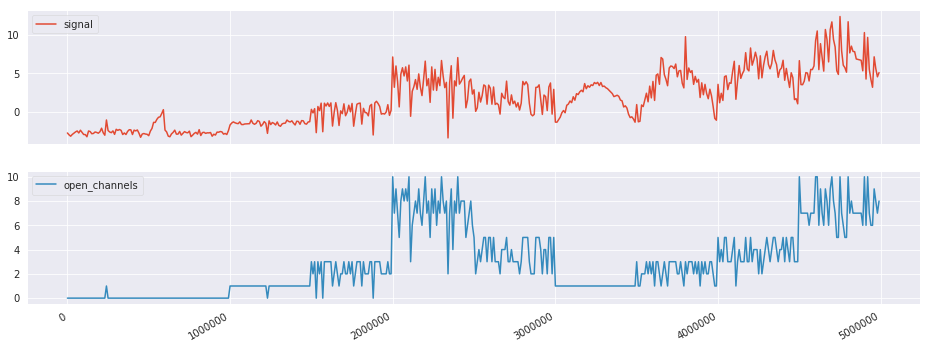

In [67]:
def plot_by_channel_summaries(df : pd.DataFrame, resample : int) -> NoReturn :
    train_resampled = df.iloc[::resample, :]
    train_resampled[['signal','open_channels']].plot(subplots=True)
    plt.show()
    
plot_by_channel_summaries(train, 10000)

In [68]:
def plot_smoothed_batch(i : int, window : int) -> NoReturn:
    batch_resampled = train[train.batch==i].iloc[::1000, :]
    ts = batch_resampled['signal']
    plt.plot(ts, 'r-', color='royalblue')
    plt.ylabel('Signal')
    smooth_data = pd.Series(ts).rolling(window=window).mean().plot(style='k')
    plt.show()

In [69]:
def maddest(d, axis=None):
    return np.mean(np.absolute(d - np.mean(d, axis)), axis)

def high_pass_filter(x, low_cutoff=1000, sample_rate=10000):
    nyquist = 0.5 * sample_rate
    norm_low_cutoff = low_cutoff / nyquist
    print(norm_low_cutoff)
    sos = butter(10, Wn=[norm_low_cutoff], btype='highpass', output='sos')
    filtered_sig = signal.sosfilt(sos, x)
    return filtered_sig

def denoise_signal( x, wavelet='db4', level=1):
    coeff = pywt.wavedec( x, wavelet, mode="per" )
    sigma = (1/0.6745) * maddest( coeff[-level] )
    uthresh = sigma * np.sqrt( 2*np.log( len( x ) ) )
    coeff[1:] = ( pywt.threshold( i, value=uthresh, mode='hard' ) for i in coeff[1:] )
    return pywt.waverec( coeff, wavelet, mode='per' )

In [70]:
def plot_acf_pacf(i : int, lag : int, resample : int) -> NoReturn:
    batch_resampled = train[train.batch==i].iloc[::resample, :]
    plot_acf( batch_resampled['signal'], lags=lag)
    plot_pacf(batch_resampled['signal'], lags=lag)
    plt.show()

In [71]:
def add_rooling_data(df : pd.DataFrame) -> pd.DataFrame:
    window_sizes = [10, 50, 100, 1000]
    for window in window_sizes:
        df["rolling_mean_" + str(window)] = df['signal'].rolling(window=window).mean()
        df["rolling_std_" + str(window)] = df['signal'].rolling(window=window).std()
    return df

In [72]:
train = add_rooling_data(train)

In [73]:
def plot_rolling_window(i : int, resample : int) -> NoReturn:
    window_sizes = [10, 50, 100, 1000]
    fig, ax = plt.subplots(len(window_sizes),1,figsize=(20, 6 * len(window_sizes)))
    n = 0
    for col in train.columns.values:
        if 'rolling_' in col:
            if 'mean' in col:
                mean_df = train[train.batch==i].iloc[::resample,:][col]
                ax[n].plot(mean_df, label=col, color='navy')
            if 'std' in col:
                std = train[train.batch==i].iloc[::resample,:][col].values
                ax[n].fill_between(mean_df.index.values,
                               mean_df.values-std, mean_df.values+std,
                               facecolor='lightskyblue',
                               alpha = 0.5, label=col)
                ax[n].legend()
                n+=1

In [74]:
def plot_batch(i : int, resample : int) -> NoReturn:
    batch_resampled = train[train.batch==i].iloc[::resample, :]
    batch_resampled[['signal','open_channels']].plot(subplots=True)
    plt.show()
    ax = sns.distplot(batch_resampled[['signal']], rug=True)
    ax.set_title(f'  Signal Distribution Batch=={i}', fontsize=13)
    #mod = AutoReg(batch_resampled['signal'], 3)
    #res = mod.fit(cov_type="HC0")
    #sel = ar_select_order(batch_resampled['signal'], 3, glob=True)
    #sel.ar_lags
    #res = sel.model.fit()
    #fig = plt.figure(figsize=(16,9))
    #fig = res.plot_diagnostics(fig=fig, lags=25)
    plot_rolling_window(i, resample)
    return None

In [75]:
def plot_signal_distribution_by_target(i : int) -> NoReturn :
    data_by_target = train[train.open_channels==0]
    ax = sns.distplot(data_by_target[['signal']], rug=True)
    ax.set_title(f'Signal Distribution for Target=={i}', fontsize=13)
    plt.show()
    return None

In [76]:
def plot_denoided_batch(i : int, resample : int) -> NoReturn : 
    batch_resampled = train[train.batch==i].iloc[::5000, :]  
    batch_resampled['x_dn_1'] = denoise_signal(batch_resampled['signal'], wavelet='db4', level=1)
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=batch_resampled.time, mode='lines+markers', y=batch_resampled.signal, marker=dict(color="lightskyblue"), name="Original signal"))
    fig.add_trace(go.Scatter(x=batch_resampled.time, y=batch_resampled.x_dn_1, mode='lines', marker=dict(color="navy"), name="Denoised signal"))
    fig.show()

## Different plots for each batch, denoised batch signal and Signal Distribution for each Target

For showing each batch or eatch target distribution just call the function with the batch nymber

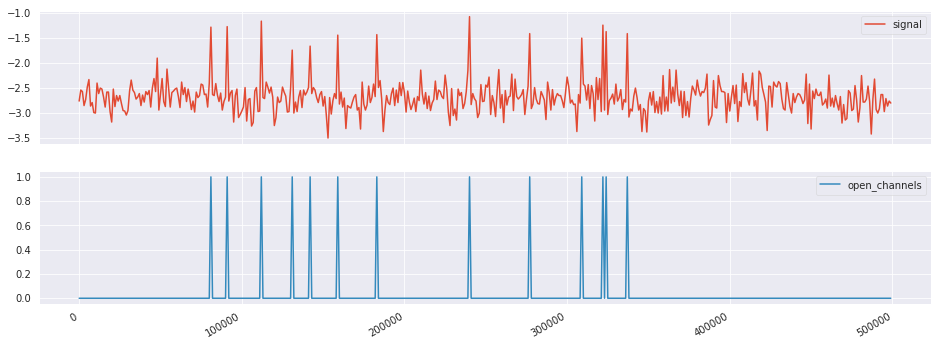

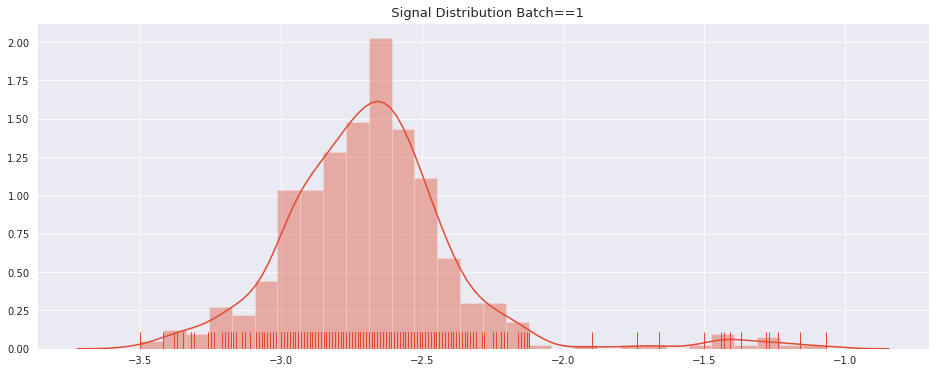

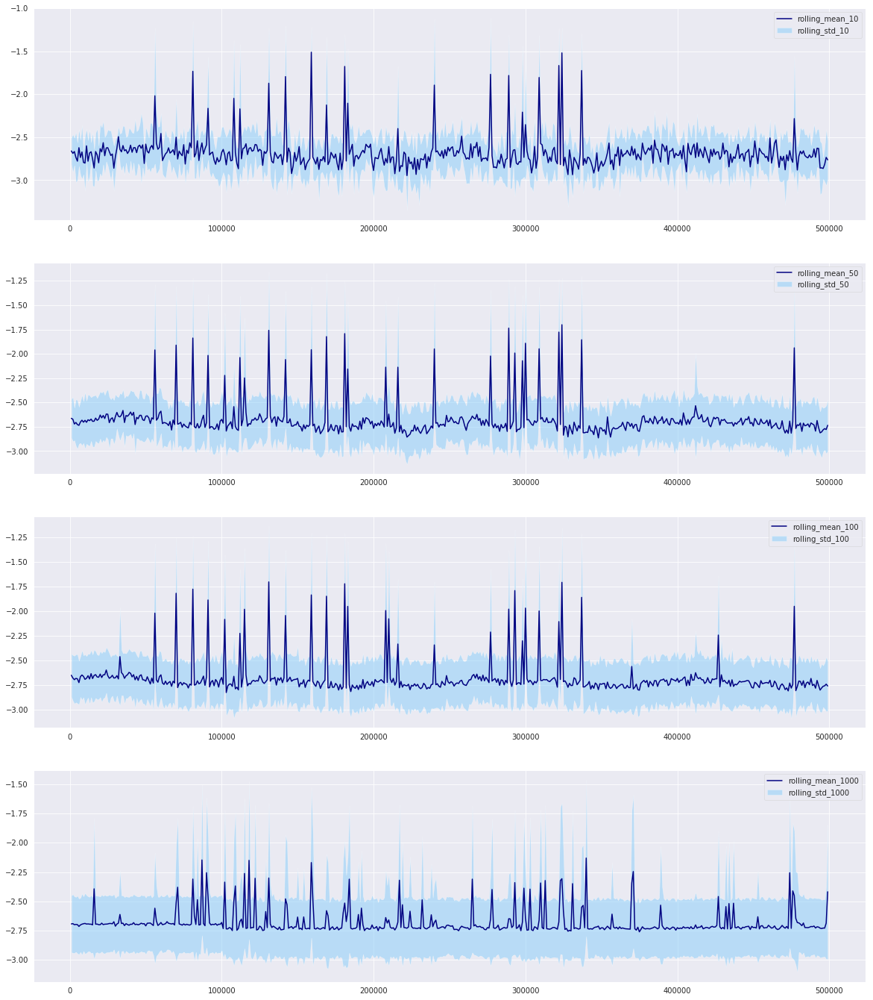

In [77]:
plot_batch(1, resample=1000)

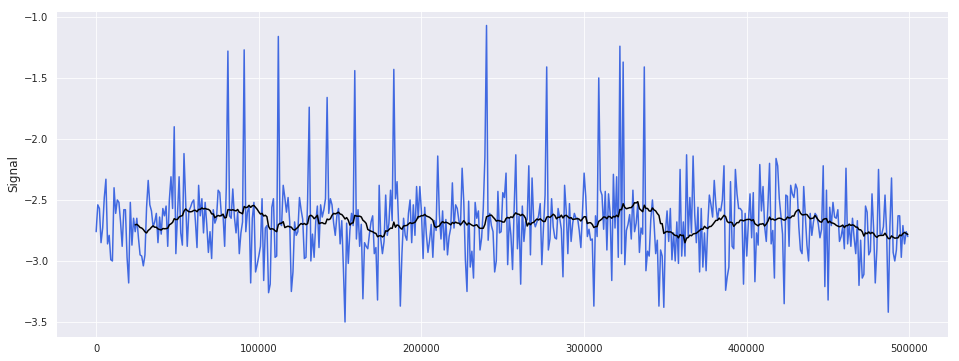

In [78]:
plot_smoothed_batch(1, window=25)

In [79]:
plot_denoided_batch(1, resample=5000)

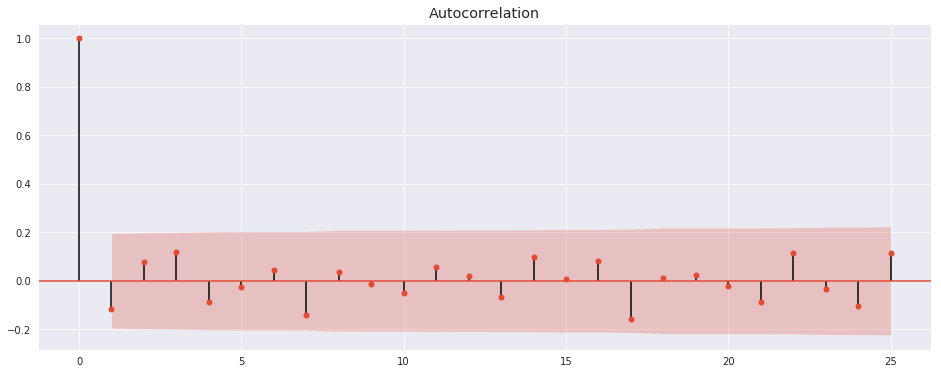

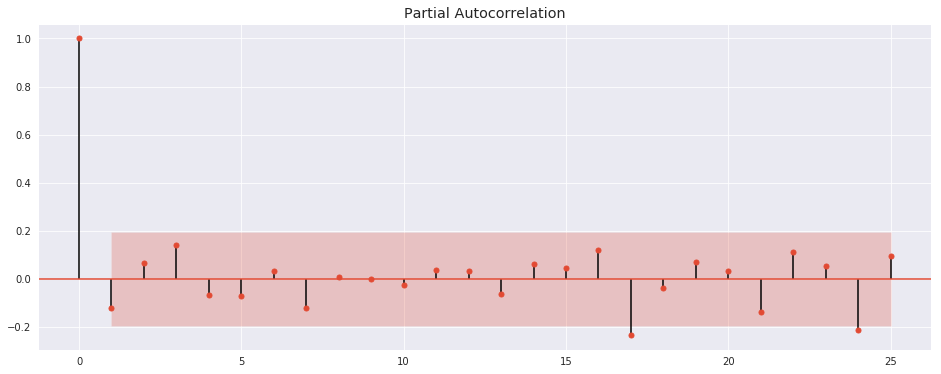

In [80]:
plot_acf_pacf(1, lag=25, resample=5000)

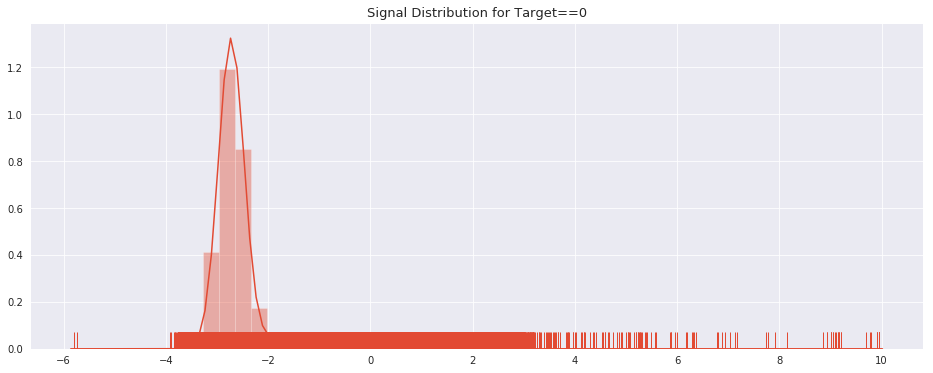

In [81]:
plot_signal_distribution_by_target(0)

## Predictive Modeling

In [84]:
base = os.path.abspath('../data')
#base = os.path.abspath('/kaggle/input/liverpool-ion-switching/')
train = pd.read_csv(os.path.join(base + '/train.csv.bz2'), #nrows=5000,
                    dtype={'time': np.float32, 'signal': np.float32, 'open_channels': 'uint8'})
test  = pd.read_csv(os.path.join(base + '/test.csv.bz2'), #nrows=5000,
                    dtype={'time': np.float32, 'signal': np.float32})

In [85]:
print('train.shape:', train.shape)
print('test.shape:', test.shape)

train.shape: (5000000, 3)
test.shape: (2000000, 2)


In [86]:
train.head()

,time,signal,open_channels
0,0.0001,-2.7600,0
1,0.0002,-2.8557,0
2,0.0003,-2.4074,0
3,0.0004,-3.1404,0
4,0.0005,-3.1525,0


In [88]:
def features(df):
    df = df.sort_values(by=['time']).reset_index(drop=True)
    df.index = ((df.time * 10_000) - 1).values
    df['batch'] = df.index // 25_000
    df['batch_index'] = df.index  - (df.batch * 25_000)
    df['batch_slices'] = df['batch_index']  // 2500
    df['batch_slices2'] = df.apply(
        lambda r: '_'.join([str(r['batch']).zfill(3), str(r['batch_slices']).zfill(3)]), axis=1)
    
    for c in ['batch','batch_slices2']:
        d = {}
        d['mean'+c] = df.groupby([c])['signal'].mean()
        d['median'+c] = df.groupby([c])['signal'].median()
        d['max'+c] = df.groupby([c])['signal'].max()
        d['min'+c] = df.groupby([c])['signal'].min()
        d['std'+c] = df.groupby([c])['signal'].std()
        d['mean_abs_chg'+c] = df.groupby([c])['signal'].apply(lambda x: np.mean(np.abs(np.diff(x))))
        d['abs_max'+c] = df.groupby([c])['signal'].apply(lambda x: np.max(np.abs(x)))
        d['abs_min'+c] = df.groupby([c])['signal'].apply(lambda x: np.min(np.abs(x)))
        d['range'+c] = d['max'+c] - d['min'+c]
        d['maxtomin'+c] = d['max'+c] / d['min'+c]
        d['abs_avg'+c] = (d['abs_min'+c] + d['abs_max'+c]) / 2
        for v in d:
            df[v] = df[c].map(d[v].to_dict())

    #add shifts
    df['signal_shift_+1'] = [0,] + list(df['signal'].values[:-1])
    df['signal_shift_-1'] = list(df['signal'].values[1:]) + [0]
    for i in df[df['batch_index']==0].index:
        df['signal_shift_+1'][i] = np.nan
    for i in df[df['batch_index']==49999].index:
        df['signal_shift_-1'][i] = np.nan

    for c in [c1 for c1 in df.columns if c1 not in [
        'time', 'signal', 'open_channels', 'batch', 'batch_index', 'batch_slices', 'batch_slices2']]:
        df[c+'_msignal'] = df[c] - df['signal']
        
    return df

In [89]:
%time train = features(train)

KeyboardInterrupt: 

In [90]:
%time test = features(test)

MemoryError: 

In [91]:
train.to_csv('featured_train.csv')
test.to_csv('featured_test.csv')

In [92]:
!bzip2 featured*.csv

In [93]:
train.head()

,time,signal,open_channels
0,0.0001,-2.7600,0
1,0.0002,-2.8557,0
2,0.0003,-2.4074,0
3,0.0004,-3.1404,0
4,0.0005,-3.1525,0


In [ ]:
col = [c for c in train.columns if c not in [
    'time', 'open_channels', 'batch', 'batch_index', 'batch_slices', 'batch_slices2']]

x1, x2, y1, y2 = model_selection.train_test_split(
    train[col], train['open_channels'], test_size=0.3, random_state=7)

del train

In [ ]:
def MacroF1Metric(preds, dtrain):
    labels = dtrain.get_label()
    preds = np.round(np.clip(preds, 0, 10)).astype('uint8')
    score = metrics.f1_score(labels, preds, average='macro')
    return ('MacroF1Metric', score, True)

In [ ]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor

In [ ]:
preds = np.round(np.clip(preds, 0, 10)).astype('uint8')

In [ ]:
submission = pd.DataFrame({'time': test.time, 'open_channels': preds2})

In [ ]:
submission.to_csv('submission.csv', index=False, float_format='%.4f')